In [2]:
!pip install transformers

In [3]:
# from google.colab import drive
# drive.mount('/content/drive')

In [4]:
#@title import packages

import torch
import numpy as np
import pandas as pd
from PIL import Image
from torchvision.transforms.functional import pil_to_tensor
from sklearn.metrics import pairwise_distances_argmin_min
from sklearn.cluster import KMeans

import torch.nn as nn

from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torchvision.transforms import ToTensor, Normalize, Resize, Compose, ToPILImage

```python 
    def imsc(img, *args, quiet=False, lim=None, interpolation='lanczos', **kwargs):
    This function rescale the image's pixel intensity range. 
    e.g. original  
    [[ 34,  89, 200],
    [123, 178, 255],
    [ 12,  45, 100]]
    after rescaling : 
    [[0.133, 0.349, 0.784],
    [0.482, 0.698, 1.000],
    [0.047, 0.176, 0.392]]
```
why use it for the first step :
1. Smoother gradients: Using values ​​of [0, 1] helps prevent exploding or vanishing gradients, thus improving the training stability of the model.
2. Faster convergence: When the input data range is smaller, the neural network can converge faster, that is, find the optimal solution faster, and the training efficiency is higher.

In [5]:
#@title Plotting functions

import argparse
import torch
import matplotlib.pyplot as plt
import torchvision.transforms
from torch import nn
from torchvision import transforms
import torch.nn.modules.utils as nn_utils
import math
#import timm
import types
from pathlib import Path
from typing import Union, List, Tuple
from PIL import Image
from matplotlib.colors import ListedColormap

def imsc(img, *args, quiet=False, lim=None, interpolation='lanczos', **kwargs):
    r"""Rescale and displays an image represented as a img.
    The function scales the img :attr:`im` to the [0 ,1] range.
    The img is assumed to have shape :math:`3\times H\times W` (RGB)
    :math:`1\times H\times W` (grayscale).
    Args:
        img (:class:`torch.Tensor` or :class:`PIL.Image`): image.
        quiet (bool, optional): if False, do not display image.
            Default: ``False``.
        lim (list, optional): maximum and minimum intensity value for
            rescaling. Default: ``None``.
        interpolation (str, optional): The interpolation mode to use with
            :func:`matplotlib.pyplot.imshow` (e.g. ``'lanczos'`` or
            ``'nearest'``). Default: ``'lanczos'``.
    Returns:
        :class:`torch.Tensor`: Rescaled image img.
    """
    if isinstance(img, Image.Image):
        img = pil_to_tensor(img)
    handle = None
    with torch.no_grad():
        if not lim:
            lim = [img.min(), img.max()]
        img = img - lim[0]  # also makes a copy
        img.mul_(1 / (lim[1] - lim[0]))
        img = torch.clamp(img, min=0, max=1)
        if not quiet:
            bitmap = img.expand(3,
                                *img.shape[1:]).permute(1, 2, 0).cpu().numpy()
    return bitmap

def draw_correspondences(points1: List[Tuple[float, float]], points2: List[Tuple[float, float]],
                         image1: Image.Image, image2: Image.Image) -> Tuple[plt.Figure, plt.Figure]:
    """
    draw point correspondences on images.
    :param points1: a list of (y, x) coordinates of image1, corresponding to points2.
    :param points2: a list of (y, x) coordinates of image2, corresponding to points1.
    :param image1: a PIL image.
    :param image2: a PIL image.
    :return: two figures of images with marked points.
    """
    assert len(points1) == len(points2), f"points lengths are incompatible: {len(points1)} != {len(points2)}."
    num_points = len(points1)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
    ax1.axis('off')
    ax2.axis('off')
    #ax1.imshow(image1)
    #ax2.imshow(image2)
    ax1.imshow(imsc(image1))
    ax2.imshow(imsc(image2))

    if not points1:
      return fig

    if num_points > 15:
        cmap = plt.get_cmap('tab10')
    else:
        cmap = ListedColormap(["red", "yellow", "blue", "lime", "magenta", "indigo", "orange", "cyan", "darkgreen",
                               "maroon", "black", "white", "chocolate", "gray", "blueviolet"])
    colors = np.array([cmap(x) for x in range(num_points)])
    radius1, radius2 = 8, 1
    for point1, point2, color in zip(points1, points2, colors):
        y1, x1 = point1
        circ1_1 = plt.Circle((x1, y1), radius1, facecolor=color, edgecolor='white', alpha=0.5)
        circ1_2 = plt.Circle((x1, y1), radius2, facecolor=color, edgecolor='white')
        ax1.add_patch(circ1_1)
        ax1.add_patch(circ1_2)
        y2, x2 = point2
        circ2_1 = plt.Circle((x2, y2), radius1, facecolor=color, edgecolor='white', alpha=0.5)
        circ2_2 = plt.Circle((x2, y2), radius2, facecolor=color, edgecolor='white')
        ax2.add_patch(circ2_1)
        ax2.add_patch(circ2_2)
    return fig

Shape: torch.Size([3, 223, 320]), Dtype: torch.float32
Shape: torch.Size([3, 375, 500]), Dtype: torch.float32


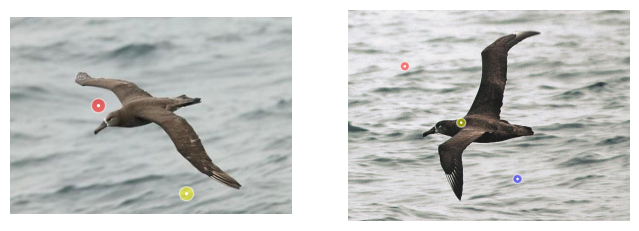

In [6]:
# This is the test code for above two functions : draw_correspondences and imsc
# It should display two images with points marked on them.
from PIL import Image
import matplotlib.pyplot as plt

image1 = Image.open('D:\\Github\\02456_Deep_Learning_Project\\data\\CUB_200_2011\\images\\001.Black_footed_Albatross\\Black_Footed_Albatross_0001_796111.jpg')
image2 = Image.open('D:\\Github\\02456_Deep_Learning_Project\\data\\CUB_200_2011\\images\\001.Black_footed_Albatross\\Black_Footed_Albatross_0003_796136.jpg')

# check the file path
# image1.show()
# image2.show()

image1_tensor = pil_to_tensor(image1).float()  # convert to tensor
image2_tensor = pil_to_tensor(image2).float()

print(f"Shape: {image1_tensor.shape}, Dtype: {image1_tensor.dtype}")
print(f"Shape: {image2_tensor.shape}, Dtype: {image2_tensor.dtype}")

points1 = [(100, 100), (200, 200), (300, 300)]
points2 = [(100, 100), (200, 200), (300, 300)]


fig = draw_correspondences(points1, points2, image1_tensor, image2_tensor)

plt.show()


In [7]:
#@title create dataset


from transformers import AutoProcessor


# CLIP Model for image, pre-processing
processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch16")
# processor = AutoProcessor.from_pretrained("openai/clip-vit-base-patch32")
# Load the parts file
parts_file = '../data/CUB_200_2011/parts/parts.txt'
with open(parts_file, 'r', encoding='utf-8') as f:
    parts = [line.strip() for line in f.readlines()]


class CUB(Dataset):
    def __init__(self, base_path, train=True):

        self.base_path = base_path

        self.labels = pd.read_csv(''.join([base_path, 'image_class_labels.txt']), header=None, sep=" ", names=["id", "label"])
        self.train_test_split = pd.read_csv(''.join([base_path, 'train_test_split.txt']), header=None, sep=" ", names=["id", "is_train"])
        self.filenames = pd.read_csv(''.join([base_path, 'images.txt']), header=None, sep=" ")

        self.transforms = Compose([
                ToTensor(),
                Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
                ])

        if train:
          mask = self.train_test_split.is_train.values == 1
        else:
          mask = self.train_test_split.is_train.values == 0

        self.filenames = self.filenames.iloc[mask]
        self.labels = self.labels[mask]

    def __len__(self):
        return self.labels.shape[0]

    def __getitem__(self, index):

        y = self.labels.iloc[index, 1] - 1
        file_name = self.filenames.iloc[index, 1]

        x = Image.open(''.join([self.base_path, 'images/', file_name])).convert('RGB')
        x = processor(images=x, return_tensors="pt")

        return x['pixel_values'].squeeze(), y

c:\Users\chens\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


variable x: tensor([[[ 0.8792,  0.7771,  0.8355,  ..., -0.0842, -0.0842,  0.0763],
         [ 0.8938,  0.8063,  0.8501,  ..., -0.1718, -0.0842, -0.0405],
         [ 0.7771,  0.8209,  0.9376,  ..., -0.2302, -0.0988, -0.2010],
         ...,
         [ 0.2515,  0.3829,  0.2223,  ..., -0.4638, -0.2886, -0.1572],
         [ 0.2661,  0.3245,  0.3537,  ..., -0.4784, -0.4930, -0.5806],
         [ 0.2515,  0.3537,  0.2953,  ..., -0.5952, -0.5222, -0.4638]],

        [[ 2.0149,  2.0299,  2.0449,  ...,  0.4691,  0.6491,  0.7242],
         [ 2.0299,  2.0299,  2.0149,  ...,  0.4390,  0.5291,  0.6942],
         [ 2.0449,  2.0449,  2.0149,  ...,  0.4390,  0.4841,  0.5441],
         ...,
         [ 0.7392,  0.6491,  0.6191,  ...,  0.4240,  0.5891,  0.8442],
         [ 0.7392,  0.7692,  0.6792,  ...,  0.3490,  0.3340,  0.4691],
         [ 0.7692,  0.7542,  0.7692,  ...,  0.3340,  0.3490,  0.3490]],

        [[ 0.8661,  0.9514,  0.9088,  ..., -0.2146, -0.0582,  0.0982],
         [ 0.8377,  0.8945,  0.93

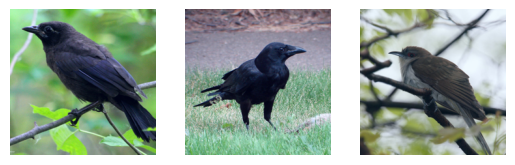

In [8]:
#@title dataset and dataloader and load samples

import random

# base_path = 'drive/MyDrive/CoSegXAI/datasets/cub200/CUB_200_2011/CUB_200_2011/' # You need to change this.
base_path = '../data/CUB_200_2011/' # You need to change this.

train_dataset = CUB(base_path)
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)
#file_names, x, y = next(iter(train_loader))

random.seed(30)
inputs, labels = [], []
data_indices = []
#data_indices = random.sample(range(train_dataset.__len__()), 10)
# Here is where we pick the images to analyse. It is smart to pick one image from the same class and one from a different class.
# That generally gives more interesting results. The data is ordered, so class 1 starts from indices (0-30), class 2 from (30-60)
# and so on.

data_indices.append(856)
data_indices.append(858)
data_indices.append(924)


for counter, data_idx in enumerate(data_indices):

  x, y = train_dataset.__getitem__(data_idx)
  print(f"variable x: {x}")
  print(f"variable y: {y}")

  #if counter == 0: x = query_transforms(x)

  inputs.append(x)
  labels.append(y)

print(labels)

plt.figure(1)
plt.subplot(131)
plt.imshow(imsc(inputs[0]))
plt.axis('off')
plt.subplot(132)
plt.imshow(imsc(inputs[1]))
plt.axis('off')
plt.subplot(133)
plt.imshow(imsc(inputs[2]))
plt.axis('off')
plt.show()


In [9]:
#@title load model

from transformers import CLIPVisionConfig, CLIPVisionModel, CLIPTextModel

# You can use the CLIPTextModel to process the text data once you get that far.
# see https://huggingface.co/docs/transformers/model_doc/clip#transformers.TFCLIPTextModel
# for more information.
# configuration = CLIPVisionConfig()
# model = CLIPVisionModel(configuration).to('cuda')
# model = CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch16").to('cuda')
model = CLIPVisionModel.from_pretrained("openai/clip-vit-large-patch14").to('cuda')
# model = CLIPVisionModel.from_pretrained("openai/clip-vit-base-patch32").to('cuda')

# text_model = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14").to('cuda')


inpus: [tensor([[[ 0.8792,  0.7771,  0.8355,  ..., -0.0842, -0.0842,  0.0763],
         [ 0.8938,  0.8063,  0.8501,  ..., -0.1718, -0.0842, -0.0405],
         [ 0.7771,  0.8209,  0.9376,  ..., -0.2302, -0.0988, -0.2010],
         ...,
         [ 0.2515,  0.3829,  0.2223,  ..., -0.4638, -0.2886, -0.1572],
         [ 0.2661,  0.3245,  0.3537,  ..., -0.4784, -0.4930, -0.5806],
         [ 0.2515,  0.3537,  0.2953,  ..., -0.5952, -0.5222, -0.4638]],

        [[ 2.0149,  2.0299,  2.0449,  ...,  0.4691,  0.6491,  0.7242],
         [ 2.0299,  2.0299,  2.0149,  ...,  0.4390,  0.5291,  0.6942],
         [ 2.0449,  2.0449,  2.0149,  ...,  0.4390,  0.4841,  0.5441],
         ...,
         [ 0.7392,  0.6491,  0.6191,  ...,  0.4240,  0.5891,  0.8442],
         [ 0.7392,  0.7692,  0.6792,  ...,  0.3490,  0.3340,  0.4691],
         [ 0.7692,  0.7542,  0.7692,  ...,  0.3340,  0.3490,  0.3490]],

        [[ 0.8661,  0.9514,  0.9088,  ..., -0.2146, -0.0582,  0.0982],
         [ 0.8377,  0.8945,  0.9372, 

c:\Users\chens\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\models\clip\modeling_clip.py:491: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\actions-runner\_work\pytorch\pytorch\builder\windows\pytorch\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:555.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(


outputs: BaseModelOutputWithPooling(last_hidden_state=tensor([[[ 0.6695,  0.8742, -0.3708,  ..., -0.3013, -0.3034, -0.4385],
         [ 0.9187,  0.1436,  1.2544,  ..., -0.0277,  0.0440,  0.0793],
         [ 1.1573,  0.0224,  1.3847,  ...,  0.2286,  0.9520, -0.4368],
         ...,
         [ 0.5455,  0.7231,  1.0579,  ...,  0.5971,  0.4840, -0.1228],
         [ 1.3511, -0.1683,  1.2807,  ..., -0.1241,  0.5094,  0.0355],
         [ 1.3220,  0.3806,  0.8457,  ..., -0.3910,  0.2945,  0.0284]]],
       device='cuda:0', grad_fn=<AddBackward0>), pooler_output=tensor([[ 1.3386,  2.0583, -0.7679,  ..., -0.2313, -0.5806, -0.9423]],
       device='cuda:0', grad_fn=<NativeLayerNormBackward0>), hidden_states=None, attentions=None)
cropped_img shape: torch.Size([224, 224, 3])
img shape: torch.Size([224, 224, 3])
outputs: BaseModelOutputWithPooling(last_hidden_state=tensor([[[ 0.6695,  0.8742, -0.3708,  ..., -0.3013, -0.3034, -0.4385],
         [ 0.9187,  0.1436,  1.2544,  ..., -0.0277,  0.0440,  0.0

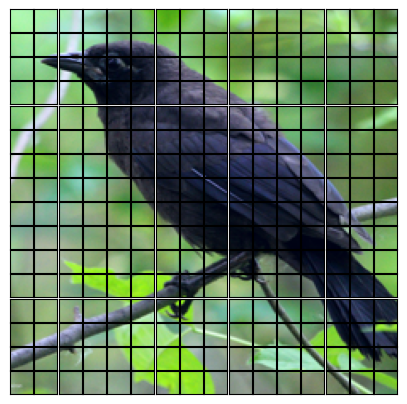

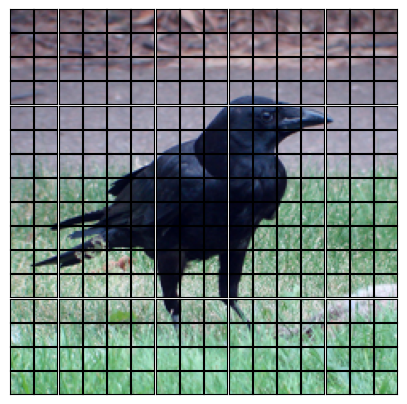

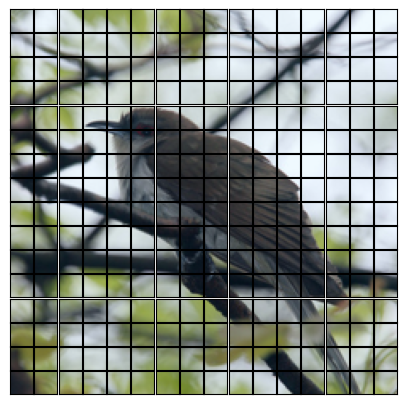

In [10]:
#@title plot patches

print(f"inpus: {inputs}")
for counter, img in enumerate(inputs):

    #img = inputs[0].permute(1, 2, 0)
    # original permute(0,1,2) -> (C,H,W)
    img = img.permute(1, 2, 0)

    H, W, C = img.shape
    # new shape (H, W, C)
    print(f"img shape: {img.shape}")

    # create a random tensor with the same shape as the input image, batch size 1
    dummy_input = torch.zeros(1, C, H, W, device='cuda')

    outputs = model(dummy_input)
    print(f"outputs: {outputs}")

    # 256 patches, 1024 features
    NUMBER_OF_PATCHES, _ = outputs.last_hidden_state[0, 1:, :].shape
    NUMBER_OF_PATCHES_H = NUMBER_OF_PATCHES_W = int(np.sqrt(NUMBER_OF_PATCHES))
    PATCH_SIZE = model.config.patch_size

    # patch_width = 14
    patch_width = PATCH_SIZE
    n_rows = H // patch_width
    n_cols = W // patch_width
    # n_rows = 16, n_cols = 16

    cropped_img = img[:n_rows * patch_width, :n_cols * patch_width, :]
    print(f"cropped_img shape: {cropped_img.shape}")
    

    #
    # Into patches
    # [n_rows, n_cols, patch_width, patch_width, C]
    #
    # create pathes 
    patches = torch.empty(n_rows, n_cols, patch_width, patch_width, C)
    for chan in range(C):
        patches[..., chan] = (
            cropped_img[..., chan]
            .reshape(n_rows, patch_width, n_cols, patch_width)
            .permute(0, 2, 1, 3)
        )

    #
    #Plot
    #
    f, axs = plt.subplots(n_rows, n_cols, figsize=(5, 5))

    for row_idx in range(n_rows):
        for col_idx in range(n_cols):

            axs[row_idx, col_idx].imshow(imsc(patches[row_idx, col_idx, ...].permute(2, 0, 1), lim=[img.min(), img.max()]))

    for ax in axs.flatten():
        ax.set_xticks([])
        ax.set_yticks([])
    f.subplots_adjust(wspace=0.05, hspace=0.05)



CLIPModel is using CLIPSdpaAttention, but `torch.nn.functional.scaled_dot_product_attention` does not support `output_attentions=True`. Falling back to the manual attention implementation, but specifying the manual implementation will be required from Transformers version v5.0.0 onwards. This warning can be removed using the argument `attn_implementation="eager"` when loading the model.


input shape: torch.Size([1, 3, 224, 224])
embedding shape: (256, 1024)
input shape: torch.Size([1, 3, 224, 224])
embedding shape: (256, 1024)
input shape: torch.Size([1, 3, 224, 224])
embedding shape: (256, 1024)
['back', 'beak', 'belly', 'breast', 'crown', 'forehead', 'left eye', 'left leg', 'left wing', 'nape', 'right eye', 'right leg', 'right wing', 'tail', 'throat', 'background', 'up-curved bill', 'down-curved bill', 'dagger-shaped bill', 'hooked bill', 'needle-like bill', 'hooked seabird bill', 'spatulate bill', 'all-purpose bill', 'cone-shaped bill', 'specialized bill', 'blue wings', 'brown wings', 'iridescent wings', 'purple wings', 'rufous wings', 'grey wings', 'yellow wings', 'olive wings', 'green wings', 'pink wings', 'orange wings', 'black wings', 'white wings', 'red wings', 'buff wings', 'blue upperparts', 'brown upperparts', 'iridescent upperparts', 'purple upperparts', 'rufous upperparts', 'grey upperparts', 'yellow upperparts', 'olive upperparts', 'green upperparts', 'pi

c:\Users\chens\AppData\Local\Programs\Python\Python312\Lib\site-packages\transformers\tokenization_utils_base.py:1617: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be deprecated in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


hidden state size : 512
last_hidden_state: torch.Size([331, 13, 512])
pooled_output: torch.Size([331, 512])
Parts embeddings shape: torch.Size([331, 512])
Patch embedding shape: torch.Size([256, 1024])
Similarity matrix shape: torch.Size([256, 512])
Patch embedding shape: torch.Size([256, 1024])
Similarity matrix shape: torch.Size([256, 512])
Patch embedding shape: torch.Size([256, 1024])
Similarity matrix shape: torch.Size([256, 512])
Image 0: Matched labels for patches
  Patch 0: back
  Patch 1: beak
  Patch 2: belly
  Patch 3: breast
  Patch 4: crown
  Patch 5: forehead
  Patch 6: left eye
  Patch 7: left leg
  Patch 8: left wing
  Patch 9: nape
  Patch 10: right eye
  Patch 11: right leg
  Patch 12: right wing
  Patch 13: tail
  Patch 14: throat
  Patch 15: background
  Patch 16: up-curved bill
  Patch 17: down-curved bill
  Patch 18: dagger-shaped bill
  Patch 19: hooked bill
  Patch 20: needle-like bill
  Patch 21: hooked seabird bill
  Patch 22: spatulate bill
  Patch 23: all-pu

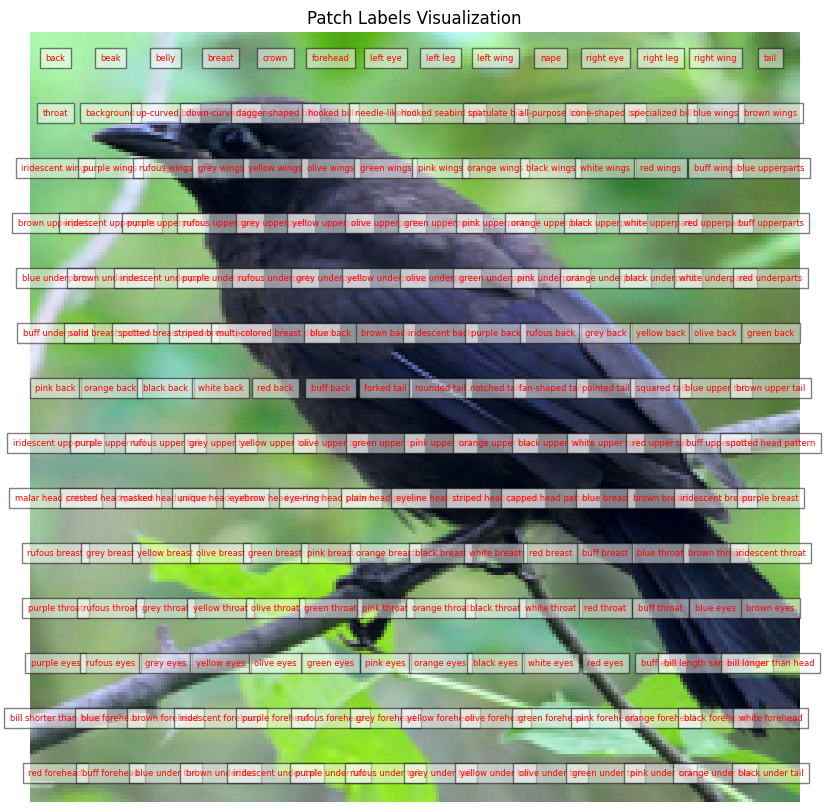

Start visualizing image 1


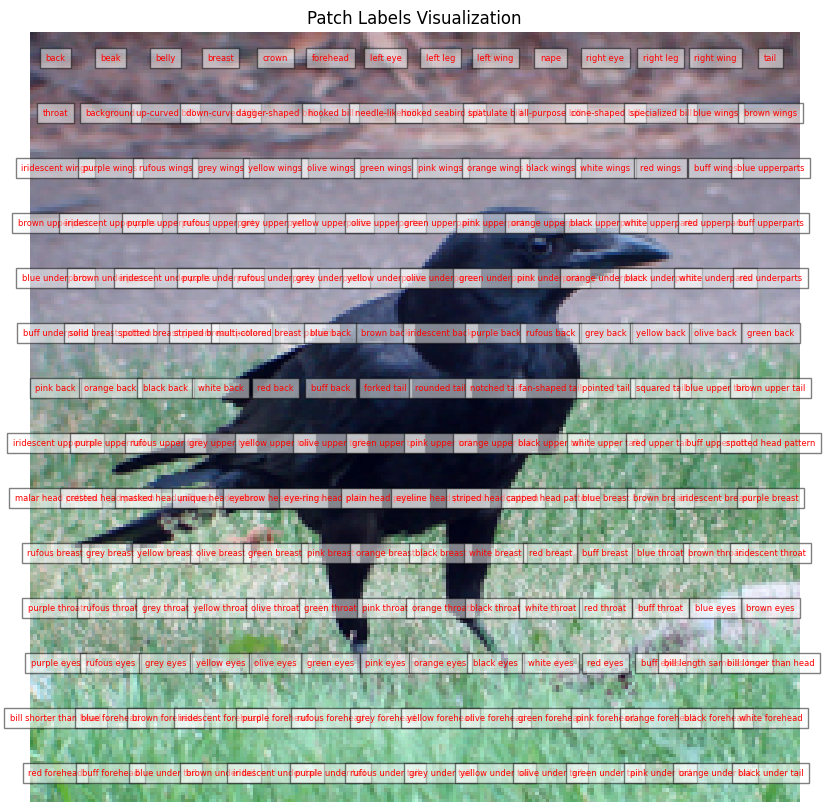

Start visualizing image 2


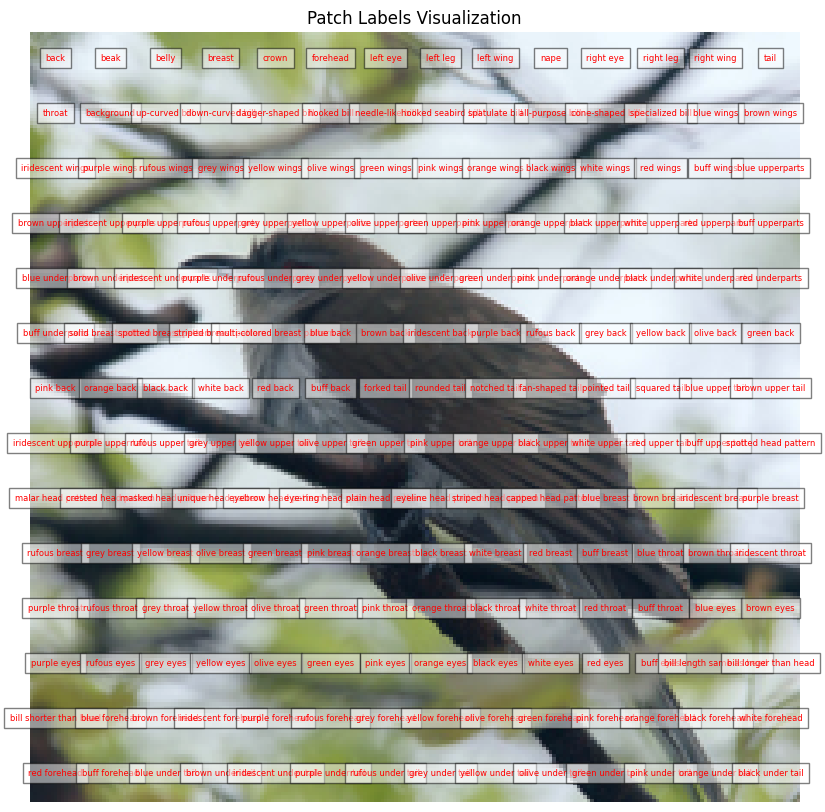

Processing image 0


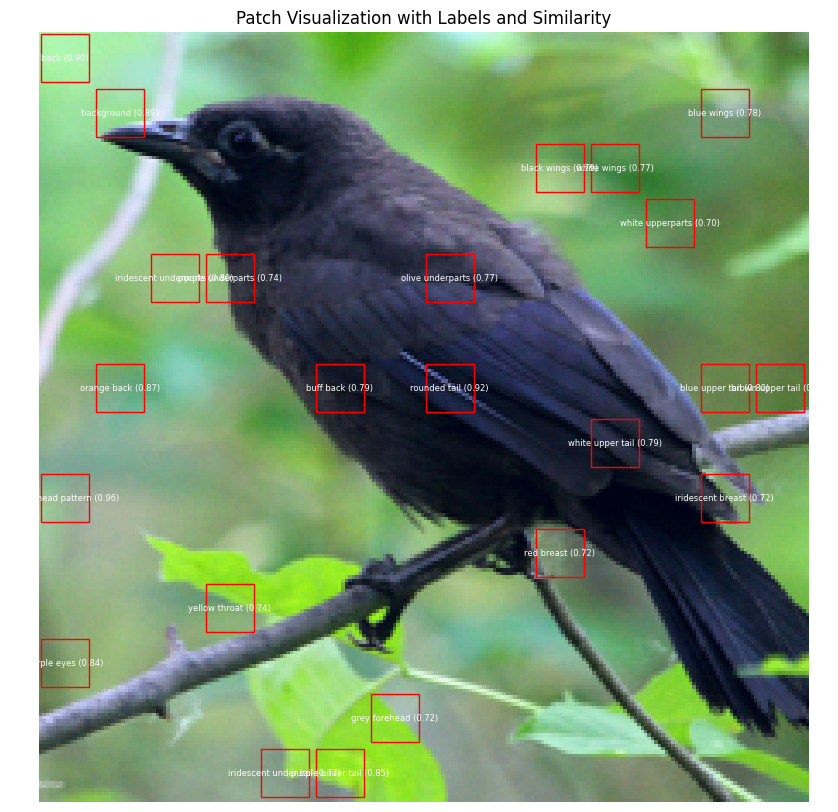

Processing image 1


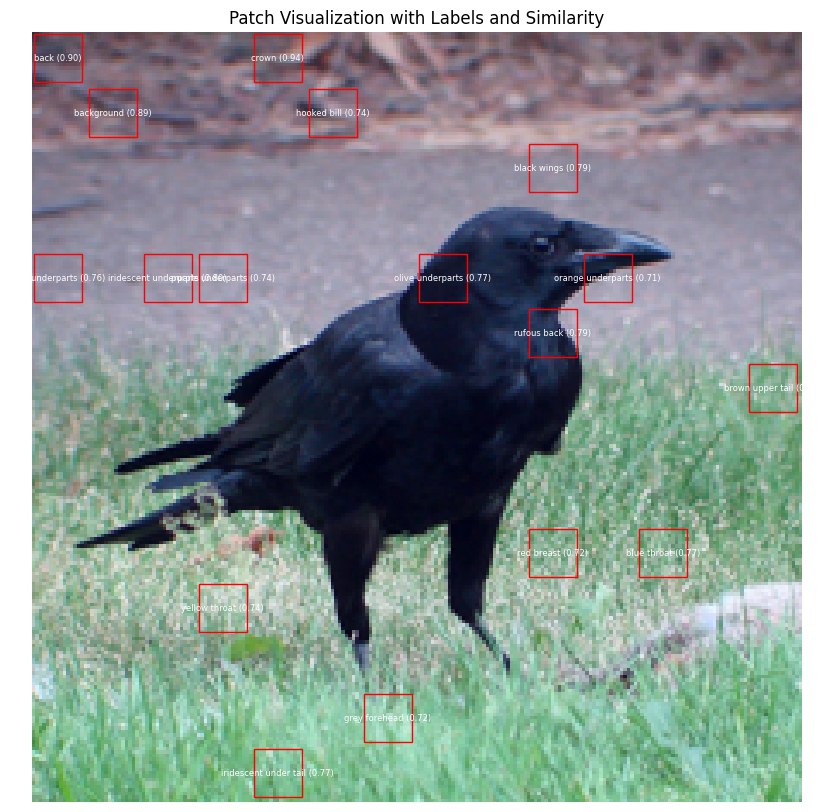

Processing image 2


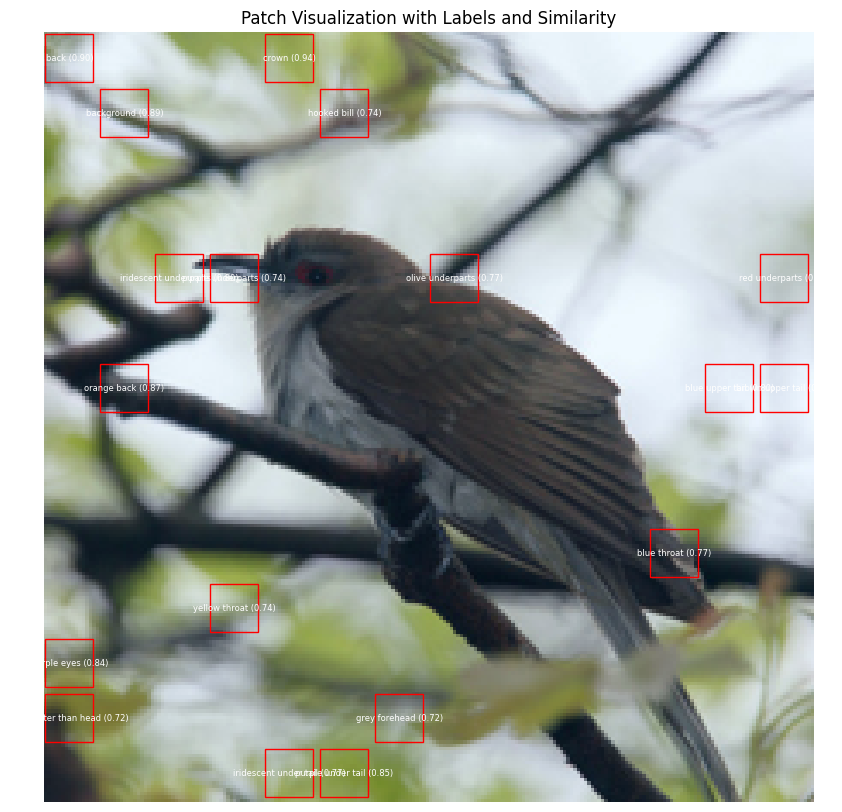


Patch Data for Image 0:
Label: back, Coordinates: (7, 7), Similarity: 0.90
Label: background, Coordinates: (23, 23), Similarity: 0.89
Label: blue wings, Coordinates: (199, 23), Similarity: 0.78
Label: black wings, Coordinates: (151, 39), Similarity: 0.79
Label: white wings, Coordinates: (167, 39), Similarity: 0.77
Label: white upperparts, Coordinates: (183, 55), Similarity: 0.70
Label: iridescent underparts, Coordinates: (39, 71), Similarity: 0.80
Label: purple underparts, Coordinates: (55, 71), Similarity: 0.74
Label: olive underparts, Coordinates: (119, 71), Similarity: 0.77
Label: orange back, Coordinates: (23, 103), Similarity: 0.87
Label: buff back, Coordinates: (87, 103), Similarity: 0.79
Label: rounded tail, Coordinates: (119, 103), Similarity: 0.92
Label: blue upper tail, Coordinates: (199, 103), Similarity: 0.80
Label: brown upper tail, Coordinates: (215, 103), Similarity: 0.72
Label: white upper tail, Coordinates: (167, 119), Similarity: 0.79
Label: malar head pattern, Coord

In [11]:
#@title create patch embeddings

device='cuda'

embedings = []

with torch.no_grad():

    for counter, input_i in enumerate(inputs):

        input_i = input_i.to(device).unsqueeze(0)
        print(f"input shape:", input_i.shape)
        # vision model with input image
        outputs = model(input_i, output_attentions=True, output_hidden_states=True)
        # Extract and normalize the last_hidden_state
        last_hidden_state = outputs.last_hidden_state
        last_hidden_state = nn.functional.normalize(last_hidden_state, p=2, dim=-1)
        # last_hidden_state: (batch_size, sequence_length, hidden_size)
        embedings.append(outputs.last_hidden_state[0, 1:, :].numpy(force=True))
        
        print(f"embedding shape:",embedings[counter].shape)

# Load the parts file
parts_file = '../data/CUB_200_2011/parts/parts.txt'
with open(parts_file, 'r', encoding='utf-8') as f:
    parts = [line.strip() for line in f.readlines()]
    
print(parts)

from transformers import AutoTokenizer, CLIPTextModel
from torch.nn.functional import cosine_similarity

new_model = CLIPTextModel.from_pretrained("openai/clip-vit-base-patch32")
tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-base-patch32")
# new_model = CLIPTextModel.from_pretrained("openai/clip-vit-large-patch14")
# tokenizer = AutoTokenizer.from_pretrained("openai/clip-vit-large-patch14")

print(f"hidden state size :", new_model.config.hidden_size) 

text_inputs = tokenizer(parts, padding=True, return_tensors="pt")
new_outputs = new_model(**text_inputs)
new_last_hidden_state = new_outputs.last_hidden_state     
# normalize the last_hidden_state
new_last_hidden_state = nn.functional.normalize(new_last_hidden_state, p=2, dim=-1)
new_pooled_output = new_outputs.pooler_output.to(device)  

print("last_hidden_state:", new_last_hidden_state.shape)  
print("pooled_output:", new_pooled_output.shape)          

device = 'cuda'

# projection_layer = torch.nn.Linear(1024, 512).to(device)
projection_layer = torch.nn.Sequential(
    torch.nn.Linear(1024, 512),
    # torch.nn.Linear(768, 512),
    torch.nn.ReLU(), # sets negative values to zero
    torch.nn.Linear(512, 512)
).to(device)

# parts_embeddings = projection_layer(new_pooled_output) # Shape: 

# Convert text embeddings to tensor
parts_embeddings = new_pooled_output  # Shape: (num_parts, 512)
print(f"Parts embeddings shape: {parts_embeddings.shape}")

# Process each image's patch embeddings
matched_labels = []
for img_idx, patch_embedding in enumerate(embedings):
    patch_embedding = torch.tensor(patch_embedding, device=device)  
    print(f"Patch embedding shape: {patch_embedding.shape}")
    projected_patch_embedding = projection_layer(patch_embedding)  
    # print(f"Projected patch embedding shape: {projected_patch_embedding.shape}")
    # Calculate cosine similarity between each patch and each part
    similarity_matrix = cosine_similarity(
        projected_patch_embedding.unsqueeze(1),  # Shape: (num_patches, 1, 512)
        parts_embeddings.unsqueeze(0)            # Shape: (1, num_parts, 512)
    )
    print(f"Similarity matrix shape: {similarity_matrix.shape}")
    
    # # Find the part with the highest similarity for each patch
    # best_match_indices = similarity_matrix.argmax(dim=1)  # Shape: (num_patches,)
    # print(f"Best match indices: {best_match_indices.cpu().numpy()}")

    # # Ensure indices are within range
    # valid_indices = [idx for idx in best_match_indices.cpu().numpy() if idx < len(parts)]
    # matched_labels.append([parts[idx] for idx in valid_indices])
    
    # Dynamic threshold based on similarity matrix statistics
    threshold = similarity_matrix.mean().item() + 0.5 * similarity_matrix.std().item()

    # Ensure indices are within range of the parts list
    valid_indices = [
        idx for idx, sim in enumerate(similarity_matrix.max(dim=1)[0])
        if sim.item() >= threshold and idx < len(parts)  # Check index validity
    ]

    # Append matched labels, ensuring valid indices only
    matched_labels.append([parts[idx] for idx in valid_indices])

 
# Print or analyze matched labels
for img_idx, labels in enumerate(matched_labels):
    print(f"Image {img_idx}: Matched labels for patches")
    for patch_idx, label in enumerate(labels):
        print(f"  Patch {patch_idx}: {label}")

# visualize the patches and their corresponding parts 
import matplotlib.pyplot as plt
import matplotlib.patches as patches
# Visualization function
def normalize_image(image):
    return (image - image.min()) / (image.max() - image.min())

def visualize_patches_with_labels(image, matched_labels, patch_size=16, stride=16):
    """
    Visualize the patches of the image with their corresponding labels.
    
    Args:
    - image (torch.Tensor): Input image tensor of shape (C, H, W).
    - matched_labels (list): List of labels for each patch.
    - patch_size (int): Size of each patch (default: 16).
    - stride (int): Stride used for extracting patches (default: 16).
    """
    image = image.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) for visualization
    image = normalize_image(image)  # Normalize pixel values to [0, 1]
    H, W, _ = image.shape
    n_rows = (H - patch_size) // stride + 1
    n_cols = (W - patch_size) // stride + 1

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    plt.axis("off")

    # Overlay labels on each patch
    for i in range(n_rows):
        for j in range(n_cols):
            patch_idx = i * n_cols + j
            if patch_idx < len(matched_labels):
                label = matched_labels[patch_idx]
                y = i * stride + patch_size // 2
                x = j * stride + patch_size // 2
                plt.text(x, y, label, color="red", fontsize=6, ha="center", va="center", bbox=dict(facecolor="white", alpha=0.5))
    
    plt.title("Patch Labels Visualization")
    plt.show()

# Visualize the image and its labels
for img_idx, (img, labels) in enumerate(zip(inputs, matched_labels)):
    print(f"Start visualizing image {img_idx}")
    visualize_patches_with_labels(img, labels, patch_size=model.config.patch_size)


def visualize_patches_with_rectangles(image, patch_data, patch_size=16, stride=16):
    """
    Visualize the patches of the image by highlighting them with rectangles.
    
    Args:
    - image (torch.Tensor): Input image tensor of shape (C, H, W).
    - patch_data (list of dict): Patch data containing coordinates, labels, and similarity.
    - patch_size (int): Size of each patch (default: 16).
    - stride (int): Stride used for extracting patches (default: 16).
    """
    image = image.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) for visualization
    image = normalize_image(image)  # Normalize pixel values to [0, 1]

    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)
    ax = plt.gca()

    # Add rectangles for each patch
    for data in patch_data:
        x, y = data['coordinates']
        label = data['label']
        similarity = data['similarity']
        rect = patches.Rectangle(
            (x - patch_size // 2, y - patch_size // 2),
            patch_size, patch_size, linewidth=1, edgecolor='red', facecolor='none'
        )
        ax.add_patch(rect)
        plt.text(
            x, y, f"{label} ({similarity:.2f})", color="white", fontsize=6,
            ha="center", va="center"
        )

    plt.axis("off")
    plt.title("Patch Visualization with Labels and Similarity")
    plt.show()

    
def get_patch_coordinates(image, matched_labels, similarity_matrix, threshold, patch_size=16, stride=16):
    """
    Get the coordinates of the patches and their labels with high similarity scores.
    
    Args:
    - image (torch.Tensor): Input image tensor of shape (C, H, W).
    - matched_labels (list): List of labels for each patch.
    - similarity_matrix (torch.Tensor): Similarity matrix of shape (num_patches, num_parts).
    - threshold (float): Minimum similarity value to display a label.
    - patch_size (int): Size of each patch (default: 16).
    - stride (int): Stride used for extracting patches (default: 16).

    Returns:
    - patch_data (list of dict): List containing patch coordinates and labels.
    """
    image = image.permute(1, 2, 0).cpu().numpy()  # Convert to (H, W, C) for processing
    H, W, _ = image.shape
    n_rows = (H - patch_size) // stride + 1
    n_cols = (W - patch_size) // stride + 1

    patch_data = []  # To store coordinates and labels

    for i in range(n_rows):
        for j in range(n_cols):
            patch_idx = i * n_cols + j
            if patch_idx < len(matched_labels):
                max_similarity = similarity_matrix[patch_idx].max().item()
                if max_similarity >= threshold:  # Only include patches above threshold
                    label = matched_labels[patch_idx]
                    # Calculate patch center coordinates
                    x = j * stride + patch_size // 2
                    y = i * stride + patch_size // 2
                    patch_data.append({
                        "label": label,
                        "coordinates": (x, y),
                        "similarity": max_similarity
                    })
    
    return patch_data

# Visualize the results
threshold = 0.7  # Set similarity threshold
all_patch_data = []  # Collect coordinates and labels for all images

for img_idx, (img, labels, sim_matrix) in enumerate(zip(inputs, matched_labels, similarity_matrix)):
    print(f"Processing image {img_idx}")
    
    # Get patch coordinates and labels
    patch_data = get_patch_coordinates(
        image=img, 
        matched_labels=labels, 
        similarity_matrix=sim_matrix, 
        threshold=threshold, 
        patch_size=model.config.patch_size
    )
    all_patch_data.append(patch_data)
    
    # Visualize patches with labels above the threshold
    visualize_patches_with_rectangles(image=img, patch_data=patch_data, patch_size=model.config.patch_size)


# Display patch data for the first image
print("\nPatch Data for Image 0:")
for data in all_patch_data[0]:
    print(f"Label: {data['label']}, Coordinates: {data['coordinates']}, Similarity: {data['similarity']:.2f}")


original code below

In [12]:
#@title STEP 1: find best buddies

nearest_neighbor_query, distances_query = pairwise_distances_argmin_min(embedings[0], np.concatenate(embedings[1:]), axis=1, metric='cosine')
nearest_neighbor_prototypes, distances_prototype = pairwise_distances_argmin_min(embedings[0], np.concatenate(embedings[1:]), axis=0, metric='cosine')

best_buddies = nearest_neighbor_prototypes[nearest_neighbor_query] == np.arange(NUMBER_OF_PATCHES)

best_buddies_query_indices = np.where(best_buddies == True)[0]
best_buddies_prototypes_indices = nearest_neighbor_query[best_buddies]

print(best_buddies_query_indices)



[  1   4   6   7   8  13  14  17  19  21  27  28  29  30  33  34  36  41
  42  45  48  49  51  57  58  61  77  78  87  91  94  95 102 103 110 112
 119 126 127 131 133 138 139 140 147 149 153 156 157 160 165 166 172 174
 177 182 192 196 202 211 217 231 238 242 244 248]


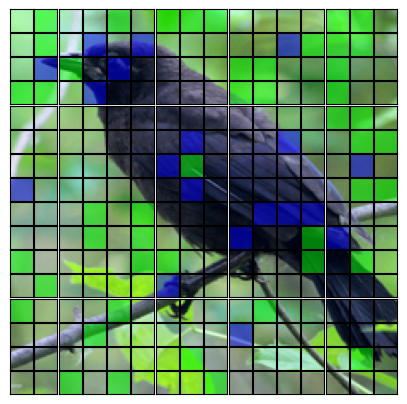

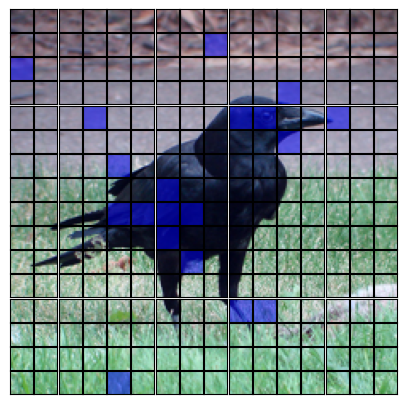

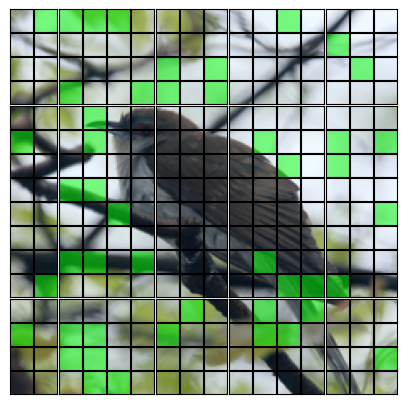

In [13]:
#@title plot patches with best buddies


for counter, img in enumerate(inputs):

    #img = inputs[0].permute(1, 2, 0)
    img = img.permute(1, 2, 0)

    H, W, C = img.shape

    dummy_input = torch.zeros(1, C, H, W, device='cuda')
    outputs = model(dummy_input)

    NUMBER_OF_PATCHES, _ = outputs.last_hidden_state[0, 1:, :].shape
    NUMBER_OF_PATCHES_H = NUMBER_OF_PATCHES_W = int(np.sqrt(NUMBER_OF_PATCHES))
    PATCH_SIZE = model.config.patch_size

    patch_width = PATCH_SIZE
    n_rows = H // patch_width
    n_cols = W // patch_width

    cropped_img = img[:n_rows * patch_width, :n_cols * patch_width, :]

    #
    # Into patches
    # [n_rows, n_cols, patch_width, patch_width, C]
    #
    patches = torch.empty(n_rows, n_cols, patch_width, patch_width, C)
    for chan in range(C):
        patches[..., chan] = (
            cropped_img[..., chan]
            .reshape(n_rows, patch_width, n_cols, patch_width)
            .permute(0, 2, 1, 3)
        )

    #
    #Plot
    #
    f, axs = plt.subplots(n_rows, n_cols, figsize=(5, 5))

    best_buddy_counter = 0

    for row_idx in range(n_rows):
        for col_idx in range(n_cols):

            axs[row_idx, col_idx].imshow(imsc(patches[row_idx, col_idx, ...].permute(2, 0, 1), lim=[img.min(), img.max()]))

            if counter == 0:
                if n_rows*row_idx+col_idx in best_buddies_query_indices:
                  if best_buddies_prototypes_indices[best_buddy_counter] > NUMBER_OF_PATCHES:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,1] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)
                  else:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,2] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                  best_buddy_counter += 1

            if counter == 1:
                if n_rows*row_idx+col_idx in best_buddies_prototypes_indices:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,2] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                    best_buddy_counter += 1

            if counter == 2:
                if (n_rows*row_idx+col_idx+NUMBER_OF_PATCHES) in best_buddies_prototypes_indices:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,1] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                    best_buddy_counter += 1

    for ax in axs.flatten():
        ax.set_xticks([])
        ax.set_yticks([])
    f.subplots_adjust(wspace=0.05, hspace=0.05)




In [14]:
#@title STEP 2: find foreground and remove best buddies beloning to background

from sklearn.decomposition import PCA

pca = PCA(n_components=10)
# The following variable is important for the thresholding. You either set it to 0 or 1.
# In the more complete code this happens automatically as you will see later.
pca_component_to_threshold = 1
pca_features = pca.fit_transform(np.concatenate(embedings))

threshold = np.mean(pca_features[:, pca_component_to_threshold])
foreground_mask = pca_features[:, pca_component_to_threshold] > threshold+0.5*np.std(pca_features[:, pca_component_to_threshold])
foreground_mask = np.array(foreground_mask).reshape(-1, NUMBER_OF_PATCHES)

prototypes_foreground_new_coordinates = nearest_neighbor_prototypes[foreground_mask[1:].flatten()]
prototypes_foreground_mask_new_coordinates = np.zeros(NUMBER_OF_PATCHES, dtype=bool)
prototypes_foreground_mask_new_coordinates[prototypes_foreground_new_coordinates] = True

print(sum(best_buddies))

best_buddies = np.bitwise_and(best_buddies, foreground_mask[0])
best_buddies = np.bitwise_and(best_buddies, prototypes_foreground_mask_new_coordinates)

print(sum(best_buddies))

best_buddies_query_indices = np.where(best_buddies == True)[0]
best_buddies_prototypes_indices = nearest_neighbor_query[best_buddies]


66
13


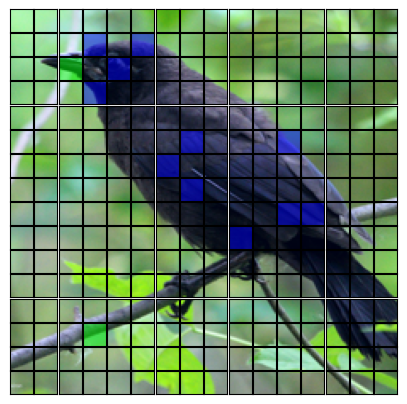

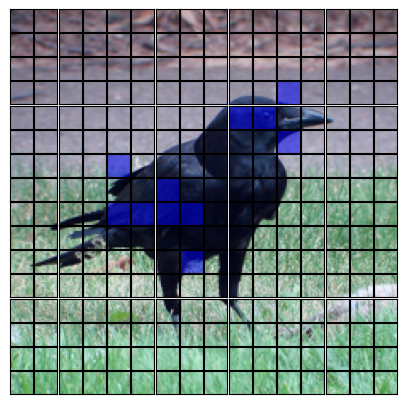

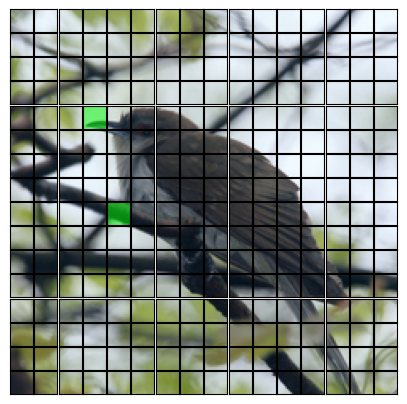

In [15]:
#@title plot patches with best buddies and background masked out


for counter, img in enumerate(inputs):

    #img = inputs[0].permute(1, 2, 0)
    img = img.permute(1, 2, 0)

    H, W, C = img.shape

    dummy_input = torch.zeros(1, C, H, W, device='cuda')
    outputs = model(dummy_input)

    NUMBER_OF_PATCHES, _ = outputs.last_hidden_state[0, 1:, :].shape
    NUMBER_OF_PATCHES_H = NUMBER_OF_PATCHES_W = int(np.sqrt(NUMBER_OF_PATCHES))
    PATCH_SIZE = model.config.patch_size

    patch_width = PATCH_SIZE
    n_rows = H // patch_width
    n_cols = W // patch_width

    cropped_img = img[:n_rows * patch_width, :n_cols * patch_width, :]

    #
    # Into patches
    # [n_rows, n_cols, patch_width, patch_width, C]
    #
    patches = torch.empty(n_rows, n_cols, patch_width, patch_width, C)
    for chan in range(C):
        patches[..., chan] = (
            cropped_img[..., chan]
            .reshape(n_rows, patch_width, n_cols, patch_width)
            .permute(0, 2, 1, 3)
        )

    #
    #Plot
    #
    f, axs = plt.subplots(n_rows, n_cols, figsize=(5, 5))

    best_buddy_counter = 0

    for row_idx in range(n_rows):
        for col_idx in range(n_cols):

            axs[row_idx, col_idx].imshow(imsc(patches[row_idx, col_idx, ...].permute(2, 0, 1), lim=[img.min(), img.max()]))

            if counter == 0:
                if n_rows*row_idx+col_idx in best_buddies_query_indices:
                  if best_buddies_prototypes_indices[best_buddy_counter] > NUMBER_OF_PATCHES:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,1] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)
                  else:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,2] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                  best_buddy_counter += 1

            if counter == 1:
                if n_rows*row_idx+col_idx in best_buddies_prototypes_indices:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,2] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                    best_buddy_counter += 1

            if counter == 2:
                if (n_rows*row_idx+col_idx+NUMBER_OF_PATCHES) in best_buddies_prototypes_indices:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,1] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                    best_buddy_counter += 1

    for ax in axs.flatten():
        ax.set_xticks([])
        ax.set_yticks([])
    f.subplots_adjust(wspace=0.05, hspace=0.05)




In [16]:
#@title STEP 3: cluster best buddies


NUMBER_OF_PAIRS = 5 # This determines the number of clusters

bb_query = embedings[0][best_buddies, :]
bb_prototypes = np.concatenate(embedings[1:])[nearest_neighbor_query[best_buddies], :]

bb_combined_patches = np.concatenate((bb_query, bb_prototypes), axis=1)
bb_combined_patches = bb_combined_patches / np.linalg.norm(bb_combined_patches, axis=1, keepdims=True)

kmeans = KMeans(n_clusters=NUMBER_OF_PAIRS, random_state=0, n_init=10).fit(bb_combined_patches)
indices_to_show = np.argmin(kmeans.transform(bb_combined_patches), axis=0)

indices_to_show = np.nonzero(best_buddies)[0][indices_to_show]
query_indices_to_show = np.arange(NUMBER_OF_PATCHES)[indices_to_show]
prototype_indices_to_show = nearest_neighbor_query[indices_to_show]


print(query_indices_to_show)
print(prototype_indices_to_show)


[211  19 140  34  36]
[388  59 132 323  74]


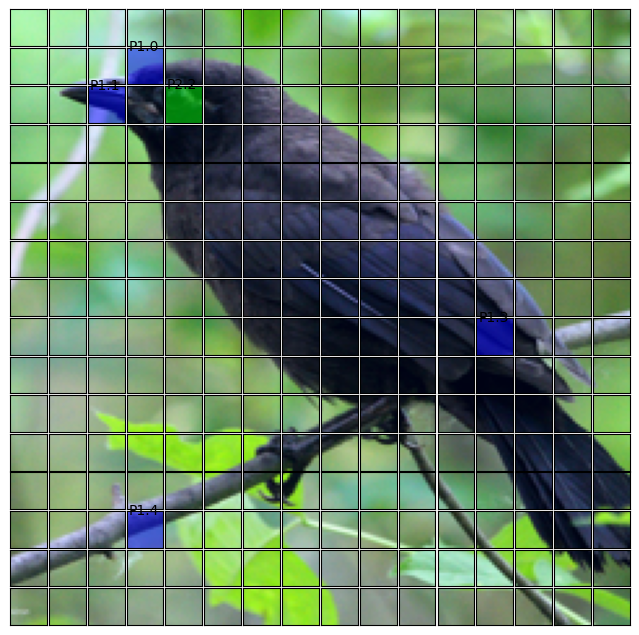

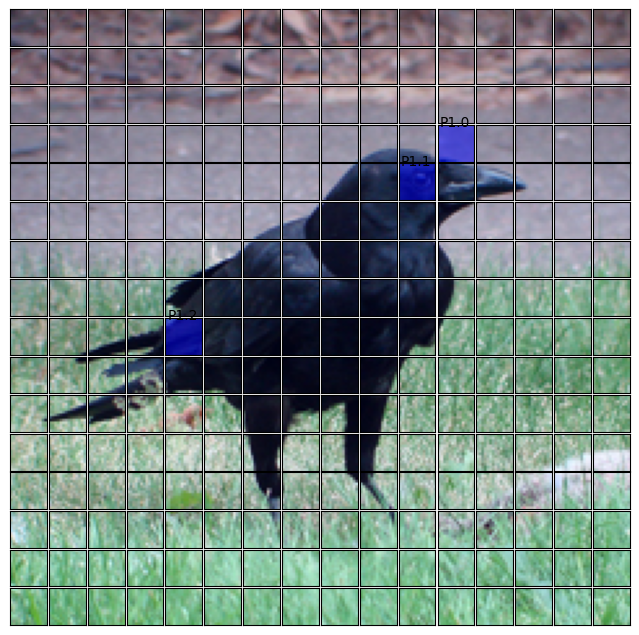

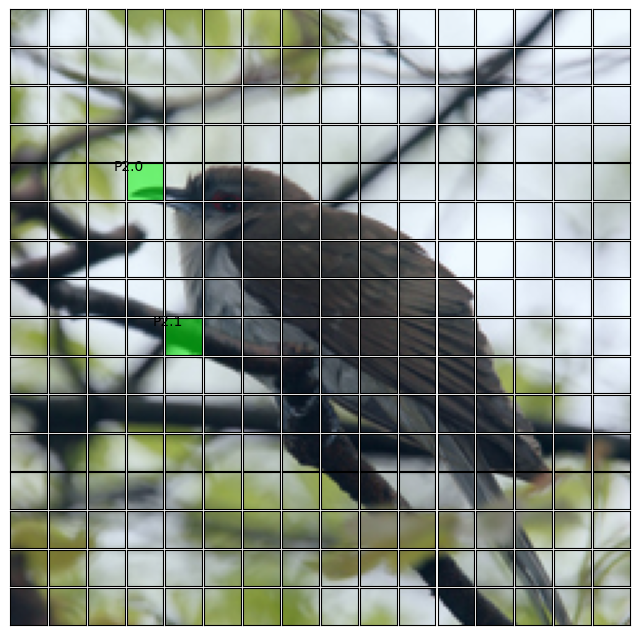

In [17]:
#@title plot query and prototypes with keypoints

for counter, img in enumerate(inputs):

    #img = inputs[0].permute(1, 2, 0)
    img = img.permute(1, 2, 0)

    H, W, C = img.shape

    dummy_input = torch.zeros(1, C, H, W, device='cuda')
    outputs = model(dummy_input)

    NUMBER_OF_PATCHES, _ = outputs.last_hidden_state[0, 1:, :].shape
    NUMBER_OF_PATCHES_H = NUMBER_OF_PATCHES_W = int(np.sqrt(NUMBER_OF_PATCHES))
    PATCH_SIZE = model.config.patch_size

    patch_width = PATCH_SIZE
    n_rows = H // patch_width
    n_cols = W // patch_width

    cropped_img = img[:n_rows * patch_width, :n_cols * patch_width, :]

    #
    # Into patches
    # [n_rows, n_cols, patch_width, patch_width, C]
    #
    patches = torch.empty(n_rows, n_cols, patch_width, patch_width, C)
    for chan in range(C):
        patches[..., chan] = (
            cropped_img[..., chan]
            .reshape(n_rows, patch_width, n_cols, patch_width)
            .permute(0, 2, 1, 3)
        )

    #
    #Plot
    #
    f, axs = plt.subplots(n_rows, n_cols, figsize=(8, 8))

    best_buddy_counter = 0

    for row_idx in range(n_rows):
        for col_idx in range(n_cols):

            axs[row_idx, col_idx].imshow(imsc(patches[row_idx, col_idx, ...].permute(2, 0, 1), lim=[img.min(), img.max()]))

            if counter == 0:
                if n_rows*row_idx+col_idx in query_indices_to_show:
                  if best_buddies_prototypes_indices[best_buddy_counter] > NUMBER_OF_PATCHES:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,1] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)
                    axs[row_idx, col_idx].text(0.0, 0.0, f"P2.{best_buddy_counter}")
                  else:
                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,2] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)
                    axs[row_idx, col_idx].text(0.4, 0.5, f"P1.{best_buddy_counter}")

                  best_buddy_counter += 1

            if counter == 1:
                if n_rows*row_idx+col_idx in prototype_indices_to_show:

                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,2] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                    axs[row_idx, col_idx].text(0.3, 0.0, f"P1.{best_buddy_counter}")
                    best_buddy_counter += 1

            if counter == 2:
                if (n_rows*row_idx+col_idx+NUMBER_OF_PATCHES) in prototype_indices_to_show:

                    color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                    color_shading[:,:,1] = 255
                    axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                    axs[row_idx, col_idx].text(0.5, 0.5, f"P2.{best_buddy_counter}", horizontalalignment='center', verticalalignment='center')
                    best_buddy_counter += 1

    for ax in axs.flatten():
        ax.set_xticks([])
        ax.set_yticks([])
    f.subplots_adjust(wspace=0.05, hspace=0.05)




Skipping invalid index: 388


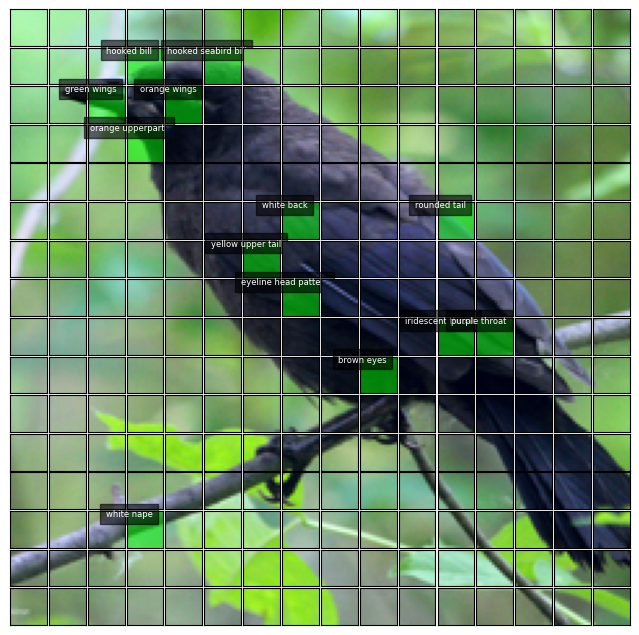

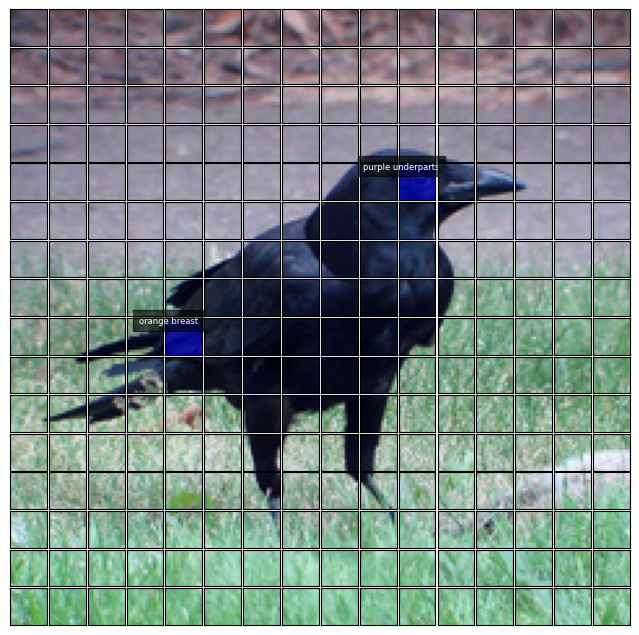

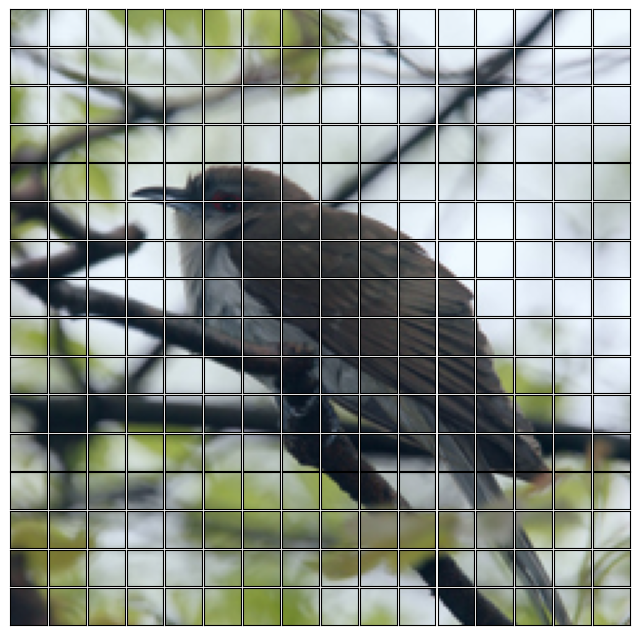

In [18]:
for counter, img in enumerate(inputs):

    img = img.permute(1, 2, 0)  # Rearrange to HWC format for visualization

    H, W, C = img.shape

    # Generate dummy input for patch calculation
    dummy_input = torch.zeros(1, C, H, W, device='cuda')
    outputs = model(dummy_input)

    # Calculate number of patches
    NUMBER_OF_PATCHES, _ = outputs.last_hidden_state[0, 1:, :].shape
    NUMBER_OF_PATCHES_H = NUMBER_OF_PATCHES_W = int(np.sqrt(NUMBER_OF_PATCHES))
    PATCH_SIZE = model.config.patch_size

    patch_width = PATCH_SIZE
    n_rows = H // patch_width
    n_cols = W // patch_width

    # Crop image to match patch grid
    cropped_img = img[:n_rows * patch_width, :n_cols * patch_width, :]

    # Convert image into patches
    patches = torch.empty(n_rows, n_cols, patch_width, patch_width, C)
    for chan in range(C):
        patches[..., chan] = (
            cropped_img[..., chan]
            .reshape(n_rows, patch_width, n_cols, patch_width)
            .permute(0, 2, 1, 3)
        )

    # Create the plot
    fig, axs = plt.subplots(n_rows, n_cols, figsize=(8, 8))
    best_buddy_counter = 0

    for row_idx in range(n_rows):
        for col_idx in range(n_cols):

            axs[row_idx, col_idx].imshow(imsc(patches[row_idx, col_idx, ...].permute(2, 0, 1), lim=[img.min(), img.max()]))

            if counter == 0 and n_rows * row_idx + col_idx in best_buddies_query_indices:
                # Ensure the index is valid for the parts list
                if best_buddy_counter < len(best_buddies_query_indices):
                    current_index = best_buddies_query_indices[best_buddy_counter]
                    if current_index < len(parts):  # Check bounds
                        # Retrieve the part label for the best buddy
                        part_label = parts[current_index]

                        # Green shading for query
                        color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                        color_shading[:, :, 1] = 255  # Green shading
                        axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                        axs[row_idx, col_idx].text(
                            0.5, 0.5, part_label, horizontalalignment='center', verticalalignment='center',
                            color='white', fontsize=6, bbox=dict(facecolor="black", alpha=0.6)
                        )
                    else:
                        print(f"Skipping invalid index: {current_index}")
                    best_buddy_counter += 1

            if counter == 1 and n_rows * row_idx + col_idx in prototype_indices_to_show:
                if best_buddy_counter < len(prototype_indices_to_show):
                    current_index = prototype_indices_to_show[best_buddy_counter]
                    if current_index < len(parts):  # Check bounds
                        # Retrieve the part label for the prototype
                        part_label = parts[current_index]

                        # Blue shading for prototype
                        color_shading = torch.zeros_like(patches[row_idx, col_idx, ...], dtype=torch.uint8)
                        color_shading[:, :, 2] = 255  # Blue shading
                        axs[row_idx, col_idx].imshow(color_shading, alpha=0.5)

                        axs[row_idx, col_idx].text(
                            0.5, 0.5, part_label, horizontalalignment='center', verticalalignment='center',
                            color='white', fontsize=6, bbox=dict(facecolor="black", alpha=0.6)
                        )
                    else:
                        print(f"Skipping invalid index: {current_index}")
                    best_buddy_counter += 1

    # Remove ticks and adjust spacing
    for ax in axs.flatten():
        ax.set_xticks([])
        ax.set_yticks([])
    fig.subplots_adjust(wspace=0.05, hspace=0.05)

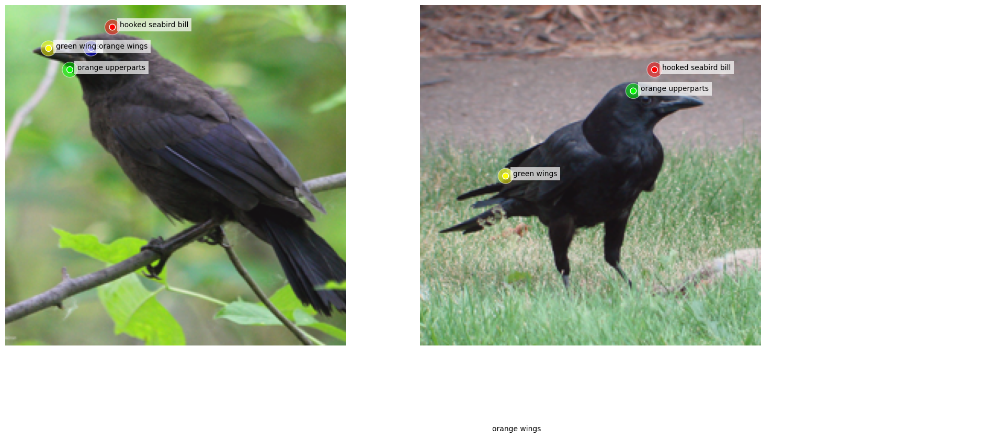

In [19]:
from typing import List, Tuple
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.patches import ConnectionPatch
from matplotlib.colors import ListedColormap


def draw_correspondences_with_labels(points1: List[Tuple[float, float]], 
                                     points2: List[Tuple[float, float]], 
                                     labels: List[str],
                                     image1: Image.Image, 
                                     image2: Image.Image) -> plt.Figure:
    """
    Draw part correspondences with labels between two images.
    
    :param points1: List of (y, x) coordinates on image1.
    :param points2: List of (y, x) coordinates on image2.
    :param labels: List of labels corresponding to the points (length must match `points1` and `points2`).
    :param image1: First PIL image (query).
    :param image2: Second PIL image (prototype).
    :return: A matplotlib figure showing the two images with marked correspondences and labels.
    """
    # assert len(points1) == len(points2) == len(labels), \
    #     f"Mismatch in lengths: {len(points1)}, {len(points2)}, {len(labels)}"
    
    num_points = len(points1)
    fig, axes = plt.subplots(1, 2, figsize=(16, 8))
    ax1, ax2 = axes
    ax1.axis('off')
    ax2.axis('off')
    
    # Display images
    ax1.imshow(image1)
    ax2.imshow(image2)
    
    # Generate colors for each correspondence
    cmap = ListedColormap(["red", "yellow", "blue", "lime", "magenta", "indigo", 
                           "orange", "cyan", "darkgreen", "maroon", "black", 
                           "white", "chocolate", "gray", "blueviolet"])
    colors = np.array([cmap(x % cmap.N) for x in range(num_points)])
    radius_outer, radius_inner = 5, 2  # Outer and inner circle sizes
    
    # Draw correspondences and labels
    for i, (point1, point2, label) in enumerate(zip(points1, points2, labels)):
        y1, x1 = point1
        y2, x2 = point2
        
        # Draw circles on the first image
        circ1_outer = plt.Circle((x1, y1), radius_outer, facecolor=colors[i], edgecolor='white', alpha=0.5)
        circ1_inner = plt.Circle((x1, y1), radius_inner, facecolor=colors[i], edgecolor='white')
        ax1.add_patch(circ1_outer)
        ax1.add_patch(circ1_inner)
        ax1.text(x1 + radius_outer, y1, label, fontsize=10, color='black', 
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        # Draw circles on the second image
        circ2_outer = plt.Circle((x2, y2), radius_outer, facecolor=colors[i], edgecolor='white', alpha=0.5)
        circ2_inner = plt.Circle((x2, y2), radius_inner, facecolor=colors[i], edgecolor='white')
        ax2.add_patch(circ2_outer)
        ax2.add_patch(circ2_inner)
        ax2.text(x2 + radius_outer, y2, label, fontsize=10, color='black', 
                 bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))
        
        # Draw a line connecting the corresponding points
        line = ConnectionPatch((x1, y1), (x2 + image1.width, y2), coordsA='data', coordsB='data',
                               axesA=ax1, axesB=ax2, color=colors[i], lw=1.5, alpha=0.7)
        fig.add_artist(line)
    
    # Adjust layout
    plt.tight_layout()
    return fig


# Ensure synchronization of points and labels
valid_correspondences = []
for query_idx, prototype_idx in zip(best_buddies_query_indices, prototype_indices_to_show):
    if query_idx < len(parts) and prototype_idx < len(parts):  # Check if indices are valid
        valid_correspondences.append((
            (query_idx // n_cols * PATCH_SIZE, query_idx % n_cols * PATCH_SIZE),  # Query point
            (prototype_idx // n_cols * PATCH_SIZE, prototype_idx % n_cols * PATCH_SIZE),  # Prototype point
            parts[query_idx]  # Label
        ))

# Unpack synchronized data
query_points, prototype_points, labels = zip(*valid_correspondences)

# Assume inputs[0] and inputs[1] are PyTorch tensors
mean = torch.tensor([0.485, 0.456, 0.406]).view(1, 1, 3).to(inputs[0].device)
std = torch.tensor([0.229, 0.224, 0.225]).view(1, 1, 3).to(inputs[0].device)

# Denormalize the query and prototype images
denormalized_query = (inputs[0].permute(1, 2, 0) * std + mean).clamp(0, 1)
denormalized_prototype = (inputs[1].permute(1, 2, 0) * std + mean).clamp(0, 1)

# Convert to uint8 and create PIL images
query_image = Image.fromarray((denormalized_query.cpu().numpy() * 255).astype(np.uint8))
prototype_image = Image.fromarray((denormalized_prototype.cpu().numpy() * 255).astype(np.uint8))

# Call the function
fig = draw_correspondences_with_labels(
    points1=query_points,
    points2=prototype_points,
    labels=labels,
    image1=query_image,
    image2=prototype_image
)

# Display the figure
plt.show(fig)

